# housing prediction


In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
df = pd.read_csv(r'E:\python\housing_prediction.csv')
df

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,127,120,RL,NaN,4928,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2007,WD,Normal,128000
1,889,20,RL,95.0,15865,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,10,2007,WD,Normal,268000
2,793,60,RL,92.0,9920,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,6,2007,WD,Normal,269790
3,110,20,RL,105.0,11751,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,MnPrv,NaN,0,1,2010,COD,Normal,190000
4,422,20,RL,NaN,16635,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,6,2009,WD,Normal,215000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1163,289,20,RL,NaN,9819,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,MnPrv,NaN,0,2,2010,WD,Normal,122000
1164,554,20,RL,67.0,8777,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,MnPrv,NaN,0,5,2009,WD,Normal,108000
1165,196,160,RL,24.0,2280,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,7,2009,WD,Normal,148500
1166,31,70,C (all),50.0,8500,Pave,Pave,Reg,Lvl,AllPub,...,0,NaN,MnPrv,NaN,0,7,2008,WD,Normal,40000


In [3]:
df.shape

(1168, 81)

In [4]:
df.dtypes

Id                 int64
MSSubClass         int64
MSZoning          object
LotFrontage      float64
LotArea            int64
                  ...   
MoSold             int64
YrSold             int64
SaleType          object
SaleCondition     object
SalePrice          int64
Length: 81, dtype: object

# our problem statement:
    goal is to predict the price of the houses with all these independant varibales so our y = SalesPrice

In [5]:
df.columns


Index(['Id', 'MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street',
       'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig',
       'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType',
       'HouseStyle', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd',
       'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType',
       'MasVnrArea', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual',
       'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1',
       'BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'Heating',
       'HeatingQC', 'CentralAir', 'Electrical', '1stFlrSF', '2ndFlrSF',
       'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath',
       'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual',
       'TotRmsAbvGrd', 'Functional', 'Fireplaces', 'FireplaceQu', 'GarageType',
       'GarageYrBlt', 'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual',
       'GarageCond', 'PavedDrive

In [6]:
df.head(15)

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,127,120,RL,NaN,4928,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2007,WD,Normal,128000
1,889,20,RL,95.0,15865,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,10,2007,WD,Normal,268000
2,793,60,RL,92.0,9920,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,6,2007,WD,Normal,269790
3,110,20,RL,105.0,11751,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,MnPrv,NaN,0,1,2010,COD,Normal,190000
4,422,20,RL,NaN,16635,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,6,2009,WD,Normal,215000
5,1197,60,RL,58.0,14054,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,11,2006,New,Partial,219210
6,561,20,RL,NaN,11341,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2010,WD,Normal,121500
7,1041,20,RL,88.0,13125,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,GdPrv,NaN,0,1,2006,WD,Normal,155000
8,503,20,RL,70.0,9170,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,GdPrv,Shed,400,4,2007,WD,Normal,140000
9,576,50,RL,80.0,8480,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,10,2008,COD,Abnorml,118500


In [7]:
df.tail(15)

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
1153,222,60,RL,NaN,8068,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,12,2009,ConLI,Normal,200000
1154,168,60,RL,86.0,10562,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,11,2007,New,Partial,325624
1155,1186,50,RL,60.0,9738,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,3,2006,WD,Normal,104900
1156,585,50,RM,51.0,6120,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,7,2009,WD,Normal,133000
1157,201,20,RM,80.0,8546,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,3,2010,WD,Normal,140000
1158,673,20,RL,NaN,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,6,2006,WD,Normal,165000
1159,943,90,RL,42.0,7711,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,8,2007,Oth,Abnorml,150000
1160,551,120,RL,53.0,4043,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,10,2008,COD,Abnorml,140000
1161,1301,60,RL,NaN,10762,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2009,WD,Normal,225000
1162,1381,30,RL,45.0,8212,Pave,Grvl,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,6,2010,WD,Normal,58500


In [8]:
pd.set_option('display.max_rows',None)

In [9]:
df

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,127,120,RL,NaN,4928,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2007,WD,Normal,128000
1,889,20,RL,95.0,15865,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,10,2007,WD,Normal,268000
2,793,60,RL,92.0,9920,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,6,2007,WD,Normal,269790
3,110,20,RL,105.0,11751,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,MnPrv,NaN,0,1,2010,COD,Normal,190000
4,422,20,RL,NaN,16635,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,6,2009,WD,Normal,215000
5,1197,60,RL,58.0,14054,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,11,2006,New,Partial,219210
6,561,20,RL,NaN,11341,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2010,WD,Normal,121500
7,1041,20,RL,88.0,13125,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,GdPrv,NaN,0,1,2006,WD,Normal,155000
8,503,20,RL,70.0,9170,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,GdPrv,Shed,400,4,2007,WD,Normal,140000
9,576,50,RL,80.0,8480,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,10,2008,COD,Abnorml,118500


In [10]:
#all rows have been displayed

In [11]:
df.dtypes

Id                 int64
MSSubClass         int64
MSZoning          object
LotFrontage      float64
LotArea            int64
Street            object
Alley             object
LotShape          object
LandContour       object
Utilities         object
LotConfig         object
LandSlope         object
Neighborhood      object
Condition1        object
Condition2        object
BldgType          object
HouseStyle        object
OverallQual        int64
OverallCond        int64
YearBuilt          int64
YearRemodAdd       int64
RoofStyle         object
RoofMatl          object
Exterior1st       object
Exterior2nd       object
MasVnrType        object
MasVnrArea       float64
ExterQual         object
ExterCond         object
Foundation        object
BsmtQual          object
BsmtCond          object
BsmtExposure      object
BsmtFinType1      object
BsmtFinSF1         int64
BsmtFinType2      object
BsmtFinSF2         int64
BsmtUnfSF          int64
TotalBsmtSF        int64
Heating           object


In [12]:
#some data are in object and some in int

In [13]:
df.isnull().sum()

Id                  0
MSSubClass          0
MSZoning            0
LotFrontage       214
LotArea             0
Street              0
Alley            1091
LotShape            0
LandContour         0
Utilities           0
LotConfig           0
LandSlope           0
Neighborhood        0
Condition1          0
Condition2          0
BldgType            0
HouseStyle          0
OverallQual         0
OverallCond         0
YearBuilt           0
YearRemodAdd        0
RoofStyle           0
RoofMatl            0
Exterior1st         0
Exterior2nd         0
MasVnrType          7
MasVnrArea          7
ExterQual           0
ExterCond           0
Foundation          0
BsmtQual           30
BsmtCond           30
BsmtExposure       31
BsmtFinType1       30
BsmtFinSF1          0
BsmtFinType2       31
BsmtFinSF2          0
BsmtUnfSF           0
TotalBsmtSF         0
Heating             0
HeatingQC           0
CentralAir          0
Electrical          0
1stFlrSF            0
2ndFlrSF            0
LowQualFin

In [14]:
# we can see null values are present

In [15]:
#filling all the null values and deleting some

In [16]:
df=df.drop(['Alley','PoolQC','Fence','MiscFeature','FireplaceQu'], axis=1)
df

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,...,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,127,120,RL,NaN,4928,Pave,IR1,Lvl,AllPub,Inside,...,0,0,0,0,0,2,2007,WD,Normal,128000
1,889,20,RL,95.0,15865,Pave,IR1,Lvl,AllPub,Inside,...,0,0,224,0,0,10,2007,WD,Normal,268000
2,793,60,RL,92.0,9920,Pave,IR1,Lvl,AllPub,CulDSac,...,0,0,0,0,0,6,2007,WD,Normal,269790
3,110,20,RL,105.0,11751,Pave,IR1,Lvl,AllPub,Inside,...,0,0,0,0,0,1,2010,COD,Normal,190000
4,422,20,RL,NaN,16635,Pave,IR1,Lvl,AllPub,FR2,...,0,0,0,0,0,6,2009,WD,Normal,215000
5,1197,60,RL,58.0,14054,Pave,IR1,Lvl,AllPub,Inside,...,0,0,0,0,0,11,2006,New,Partial,219210
6,561,20,RL,NaN,11341,Pave,IR1,Lvl,AllPub,Inside,...,0,0,95,0,0,5,2010,WD,Normal,121500
7,1041,20,RL,88.0,13125,Pave,Reg,Lvl,AllPub,Corner,...,0,0,0,0,0,1,2006,WD,Normal,155000
8,503,20,RL,70.0,9170,Pave,Reg,Lvl,AllPub,Corner,...,184,0,0,0,400,4,2007,WD,Normal,140000
9,576,50,RL,80.0,8480,Pave,Reg,Lvl,AllPub,Inside,...,102,0,0,0,0,10,2008,COD,Abnorml,118500


In [17]:
df['LotFrontage']=df['LotFrontage'].fillna(df['LotFrontage'].mean())

In [18]:
from sklearn.impute import SimpleImputer

In [19]:
imp=SimpleImputer(strategy='most_frequent')

In [20]:
df['BsmtQual']=imp.fit_transform(df['BsmtQual'].values.reshape(-1,1))

In [21]:
df['MasVnrType']=imp.fit_transform(df['MasVnrType'].values.reshape(-1,1))

In [22]:
df['MasVnrArea']=df['MasVnrArea'].fillna(df['MasVnrArea'].mean())

In [23]:
df['BsmtCond']=imp.fit_transform(df['BsmtCond'].values.reshape(-1,1))

In [24]:
df['BsmtExposure']=imp.fit_transform(df['BsmtExposure'].values.reshape(-1,1))

In [25]:
df['BsmtFinType1']=imp.fit_transform(df['BsmtFinType1'].values.reshape(-1,1))

In [26]:
df['BsmtFinType2']=imp.fit_transform(df['BsmtFinType2'].values.reshape(-1,1))

In [27]:
df['GarageType']=imp.fit_transform(df['GarageType'].values.reshape(-1,1))

In [28]:
df['GarageFinish']=imp.fit_transform(df['GarageFinish'].values.reshape(-1,1))

In [29]:
df['GarageYrBlt']=df['GarageYrBlt'].fillna(df['GarageYrBlt'].mean())

In [30]:
df['GarageQual']=imp.fit_transform(df['GarageQual'].values.reshape(-1,1))

In [31]:
df['GarageCond']=imp.fit_transform(df['GarageCond'].values.reshape(-1,1))

In [32]:
df.isnull().sum()

Id               0
MSSubClass       0
MSZoning         0
LotFrontage      0
LotArea          0
Street           0
LotShape         0
LandContour      0
Utilities        0
LotConfig        0
LandSlope        0
Neighborhood     0
Condition1       0
Condition2       0
BldgType         0
HouseStyle       0
OverallQual      0
OverallCond      0
YearBuilt        0
YearRemodAdd     0
RoofStyle        0
RoofMatl         0
Exterior1st      0
Exterior2nd      0
MasVnrType       0
MasVnrArea       0
ExterQual        0
ExterCond        0
Foundation       0
BsmtQual         0
BsmtCond         0
BsmtExposure     0
BsmtFinType1     0
BsmtFinSF1       0
BsmtFinType2     0
BsmtFinSF2       0
BsmtUnfSF        0
TotalBsmtSF      0
Heating          0
HeatingQC        0
CentralAir       0
Electrical       0
1stFlrSF         0
2ndFlrSF         0
LowQualFinSF     0
GrLivArea        0
BsmtFullBath     0
BsmtHalfBath     0
FullBath         0
HalfBath         0
BedroomAbvGr     0
KitchenAbvGr     0
KitchenQual 

In [33]:
df.isnull().sum().sum()

0

# null values are removed

# visualisation of Data

In [34]:
pd.set_option('display.max_columns',None)

In [35]:
df

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,127,120,RL,70.98847,4928,Pave,IR1,Lvl,AllPub,Inside,Gtl,NPkVill,Norm,Norm,TwnhsE,1Story,6,5,1976,1976,Gable,CompShg,Plywood,Plywood,None,0.000000,TA,TA,CBlock,Gd,TA,No,ALQ,120,Unf,0,958,1078,GasA,TA,Y,SBrkr,958,0,0,958,0,0,2,0,2,1,TA,5,Typ,1,Attchd,1977.000000,RFn,2,440,TA,TA,Y,0,205,0,0,0,0,0,2,2007,WD,Normal,128000
1,889,20,RL,95.00000,15865,Pave,IR1,Lvl,AllPub,Inside,Mod,NAmes,Norm,Norm,1Fam,1Story,8,6,1970,1970,Flat,Tar&Grv,Wd Sdng,Wd Sdng,None,0.000000,Gd,Gd,PConc,TA,Gd,Gd,ALQ,351,Rec,823,1043,2217,GasA,Ex,Y,SBrkr,2217,0,0,2217,1,0,2,0,4,1,Gd,8,Typ,1,Attchd,1970.000000,Unf,2,621,TA,TA,Y,81,207,0,0,224,0,0,10,2007,WD,Normal,268000
2,793,60,RL,92.00000,9920,Pave,IR1,Lvl,AllPub,CulDSac,Gtl,NoRidge,Norm,Norm,1Fam,2Story,7,5,1996,1997,Gable,CompShg,MetalSd,MetalSd,None,0.000000,Gd,TA,PConc,Gd,TA,Av,GLQ,862,Unf,0,255,1117,GasA,Ex,Y,SBrkr,1127,886,0,2013,1,0,2,1,3,1,TA,8,Typ,1,Attchd,1997.000000,Unf,2,455,TA,TA,Y,180,130,0,0,0,0,0,6,2007,WD,Normal,269790
3,110,20,RL,105.00000,11751,Pave,IR1,Lvl,AllPub,Inside,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6,6,1977,1977,Hip,CompShg,Plywood,Plywood,BrkFace,480.000000,TA,TA,CBlock,Gd,TA,No,BLQ,705,Unf,0,1139,1844,GasA,Ex,Y,SBrkr,1844,0,0,1844,0,0,2,0,3,1,TA,7,Typ,1,Attchd,1977.000000,RFn,2,546,TA,TA,Y,0,122,0,0,0,0,0,1,2010,COD,Normal,190000
4,422,20,RL,70.98847,16635,Pave,IR1,Lvl,AllPub,FR2,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6,7,1977,2000,Gable,CompShg,CemntBd,CmentBd,Stone,126.000000,Gd,TA,CBlock,Gd,TA,No,ALQ,1246,Unf,0,356,1602,GasA,Gd,Y,SBrkr,1602,0,0,1602,0,1,2,0,3,1,Gd,8,Typ,1,Attchd,1977.000000,Fin,2,529,TA,TA,Y,240,0,0,0,0,0,0,6,2009,WD,Normal,215000
5,1197,60,RL,58.00000,14054,Pave,IR1,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,7,5,2006,2006,Gable,CompShg,VinylSd,VinylSd,None,0.000000,Gd,TA,PConc,Gd,TA,Av,Unf,0,Unf,0,879,879,GasA,Ex,Y,SBrkr,879,984,0,1863,0,0,2,1,4,1,Gd,9,Typ,1,BuiltIn,2006.000000,Fin,3,660,TA,TA,Y,100,17,0,0,0,0,0,11,2006,New,Partial,219210
6,561,20,RL,70.98847,11341,Pave,IR1,Lvl,AllPub,Inside,Gtl,Sawyer,Norm,Norm,1Fam,1Story,5,6,1957,1996,Hip,CompShg,Wd Sdng,Wd Sdng,BrkFace,180.000000,TA,TA,CBlock,Gd,TA,No,ALQ,1302,Unf,0,90,1392,GasA,TA,Y,SBrkr,1392,0,0,1392,1,0,1,1,3,1,TA,5,Mod,1,Detchd,1957.000000,Unf,2,528,TA,TA,Y,0,0,0,0,95,0,0,5,2010,WD,Normal,121500
7,1041,20,RL,88.00000,13125,Pave,Reg,Lvl,AllPub,Corner,Gtl,Sawyer,Norm,Norm,1Fam,1Story,5,4,1957,2000,Gable,CompShg,Wd Sdng,Wd Sdng,BrkCmn,67.000000,TA,TA,CBlock,TA,TA,No,Rec,168,BLQ,682,284,1134,GasA,Ex,Y,SBrkr,1803,0,0,1803,1,0,2,0,3,1,TA,8,Maj1,1,Attchd,1957.000000,RFn,2,484,TA,TA,Y,0,0,0,0,0,0,0,1,2006,WD,Normal,155000
8,503,20,RL,70.00000,9170,Pave,Reg,Lvl,AllPub,Corner,Gtl,Edwards,Feedr,Norm,1Fam,1Story,5,7,1965,1965,Hip,CompShg,MetalSd,MetalSd,None,0.000000,TA,TA,CBlock,TA,TA,No,ALQ,698,GLQ,96,420,1214,GasA,Ex,Y,SBrkr,1214,0,0,1214,1,0,1,0,2,1,TA,6,Typ,0,Detchd,1965.000000,Unf,2,461,Fa,Fa,Y,0,0,184,0,0,0,400,4,2007,WD,Normal,140000
9,576,50,RL,80.00000,8480,Pave,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Norm,Norm,1Fam,1.5Fin,5,5,1947,1950,Gable,CompShg,MetalSd,MetalSd,None,0.000000,TA,TA,CBlock,TA,TA,No,Rec,442,Unf,0,390,832,GasA,TA,Y,SBrkr,832,384,0,1216,0,0,1,0,2,1,TA,6,Typ,0,Detchd,1947.000000,Unf,1,336,TA,TA,Y,

In [36]:
df=df.drop(['Id','Utilities'],axis=1)
df.shape

(1168, 74)

In [37]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1168 entries, 0 to 1167
Data columns (total 74 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   MSSubClass     1168 non-null   int64  
 1   MSZoning       1168 non-null   object 
 2   LotFrontage    1168 non-null   float64
 3   LotArea        1168 non-null   int64  
 4   Street         1168 non-null   object 
 5   LotShape       1168 non-null   object 
 6   LandContour    1168 non-null   object 
 7   LotConfig      1168 non-null   object 
 8   LandSlope      1168 non-null   object 
 9   Neighborhood   1168 non-null   object 
 10  Condition1     1168 non-null   object 
 11  Condition2     1168 non-null   object 
 12  BldgType       1168 non-null   object 
 13  HouseStyle     1168 non-null   object 
 14  OverallQual    1168 non-null   int64  
 15  OverallCond    1168 non-null   int64  
 16  YearBuilt      1168 non-null   int64  
 17  YearRemodAdd   1168 non-null   int64  
 18  RoofStyl

In [38]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
MSSubClass,1168.0,56.767979,41.940650,20.0,20.00,50.000000,70.00,190.0
LotFrontage,1168.0,70.988470,22.437056,21.0,60.00,70.988470,79.25,313.0
LotArea,1168.0,10484.749144,8957.442311,1300.0,7621.50,9522.500000,11515.50,164660.0
OverallQual,1168.0,6.104452,1.390153,1.0,5.00,6.000000,7.00,10.0
OverallCond,1168.0,5.595890,1.124343,1.0,5.00,5.000000,6.00,9.0
YearBuilt,1168.0,1970.930651,30.145255,1875.0,1954.00,1972.000000,2000.00,2010.0
YearRemodAdd,1168.0,1984.758562,20.785185,1950.0,1966.00,1993.000000,2004.00,2010.0
MasVnrArea,1168.0,102.310078,182.047152,0.0,0.00,0.000000,160.00,1600.0
BsmtFinSF1,1168.0,444.726027,462.664785,0.0,0.00,385.500000,714.50,5644.0
BsmtFinSF2,1168.0,46.647260,163.520016,0.0,0.00,0.000000,0.00,1474.0


C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='MSSubClass', ylabel='Density'>

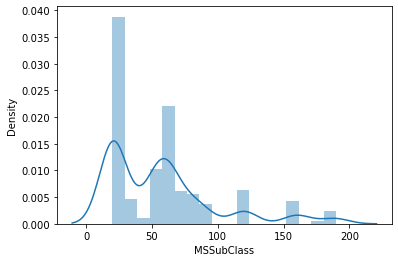

In [39]:
sns.distplot(df['MSSubClass'])

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='LotFrontage', ylabel='Density'>

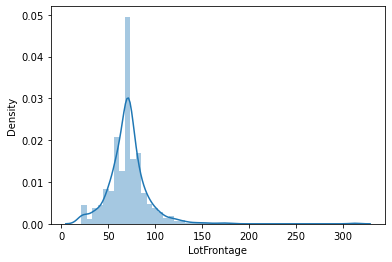

In [40]:
sns.distplot(df['LotFrontage'])

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='LotArea', ylabel='Density'>

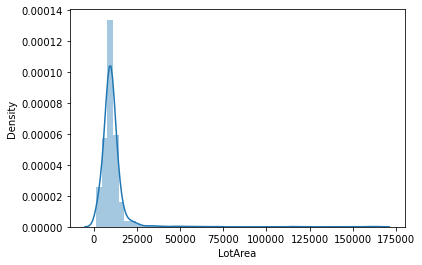

In [41]:
sns.distplot(df['LotArea'])

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='OverallCond'>

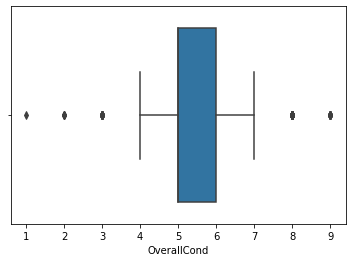

In [42]:
sns.boxplot(df['OverallCond'])

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='YearBuilt', ylabel='Density'>

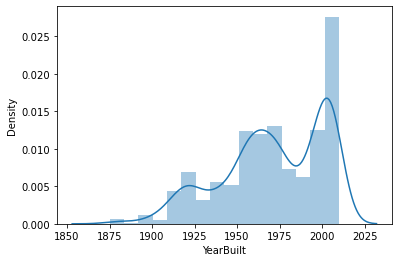

In [43]:
sns.distplot(df['YearBuilt'])

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='BsmtFinSF1'>

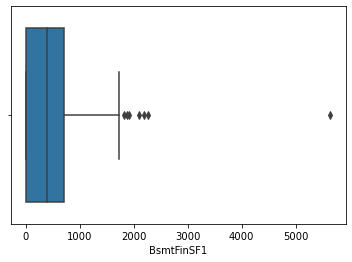

In [44]:
sns.boxplot(df['BsmtFinSF1'])

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='TotalBsmtSF', ylabel='Density'>

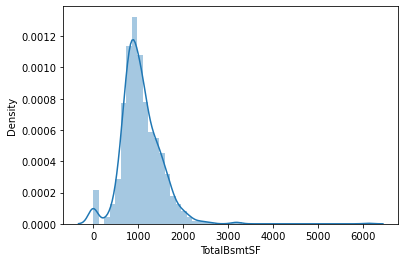

In [45]:
sns.distplot(df['TotalBsmtSF'])

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='MoSold', ylabel='Density'>

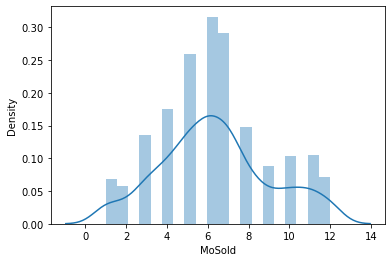

In [46]:
sns.distplot(df['MoSold'])

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='GarageArea', ylabel='Density'>

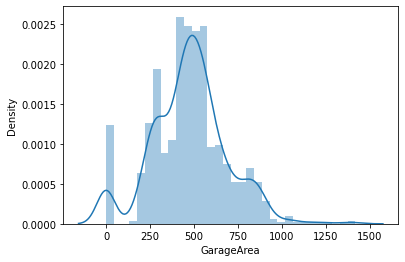

In [47]:
sns.distplot(df['GarageArea'])

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='ScreenPorch', ylabel='Density'>

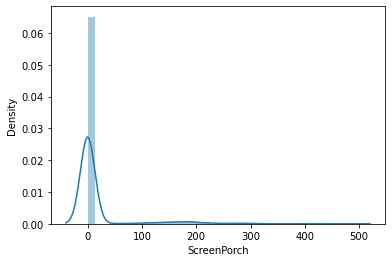

In [48]:
sns.distplot(df['ScreenPorch'])

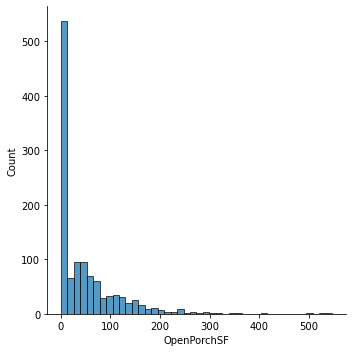

In [49]:
sns.displot(df['OpenPorchSF'])

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='WoodDeckSF'>

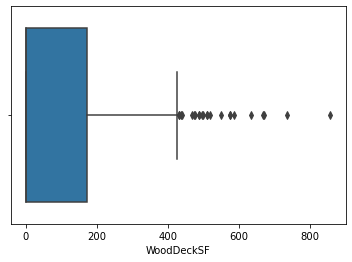

In [50]:
sns.boxplot(df['WoodDeckSF'])

<AxesSubplot:xlabel='MSZoning', ylabel='count'>

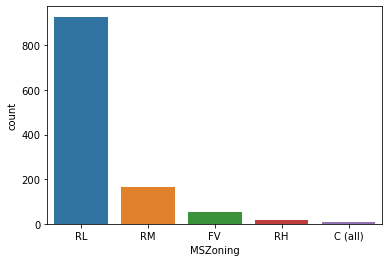

In [51]:
sns.countplot(x="MSZoning",data=df)

<AxesSubplot:xlabel='Street', ylabel='count'>

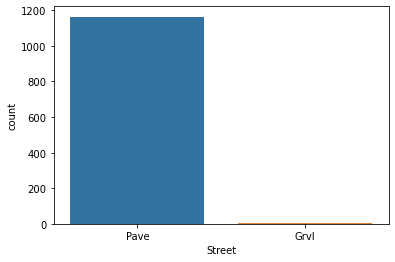

In [52]:
sns.countplot(x="Street",data=df)

<AxesSubplot:xlabel='LotShape', ylabel='count'>

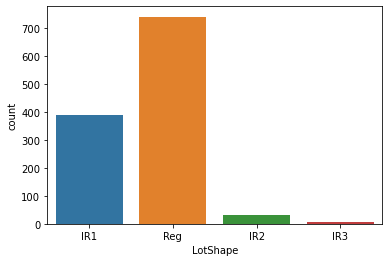

In [53]:
sns.countplot(x="LotShape",data=df)

<AxesSubplot:xlabel='LotConfig', ylabel='count'>

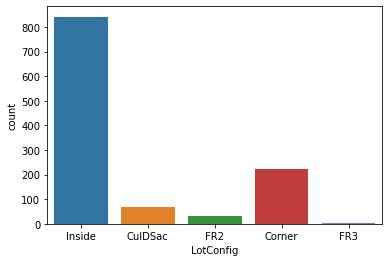

In [54]:
sns.countplot(x="LotConfig",data=df)

<AxesSubplot:xlabel='Neighborhood', ylabel='count'>

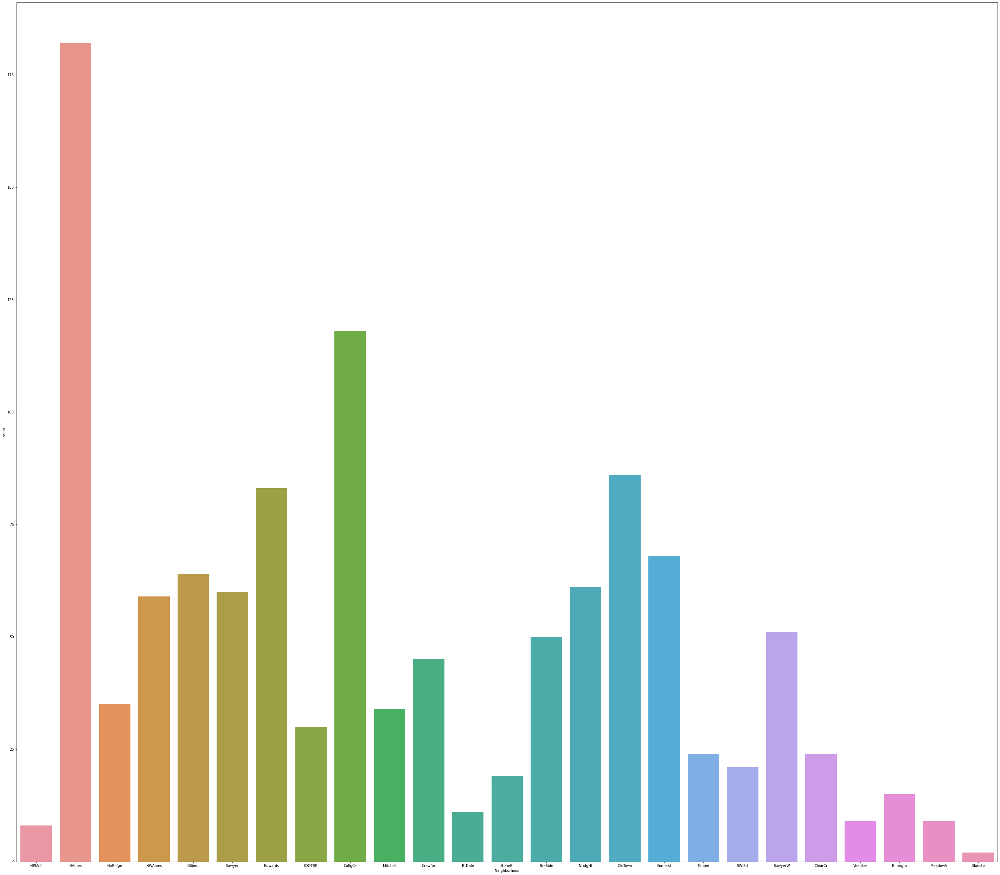

In [55]:
plt.figure(figsize=(50,45))
sns.countplot(x='Neighborhood',data=df)

<AxesSubplot:xlabel='HouseStyle', ylabel='count'>

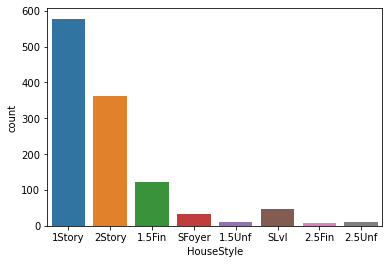

In [56]:
sns.countplot(x="HouseStyle",data=df)

<AxesSubplot:xlabel='RoofStyle', ylabel='count'>

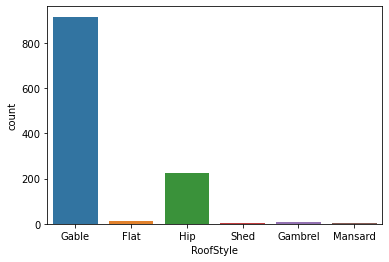

In [57]:
sns.countplot(x="RoofStyle",data=df)

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='Exterior1st', ylabel='count'>

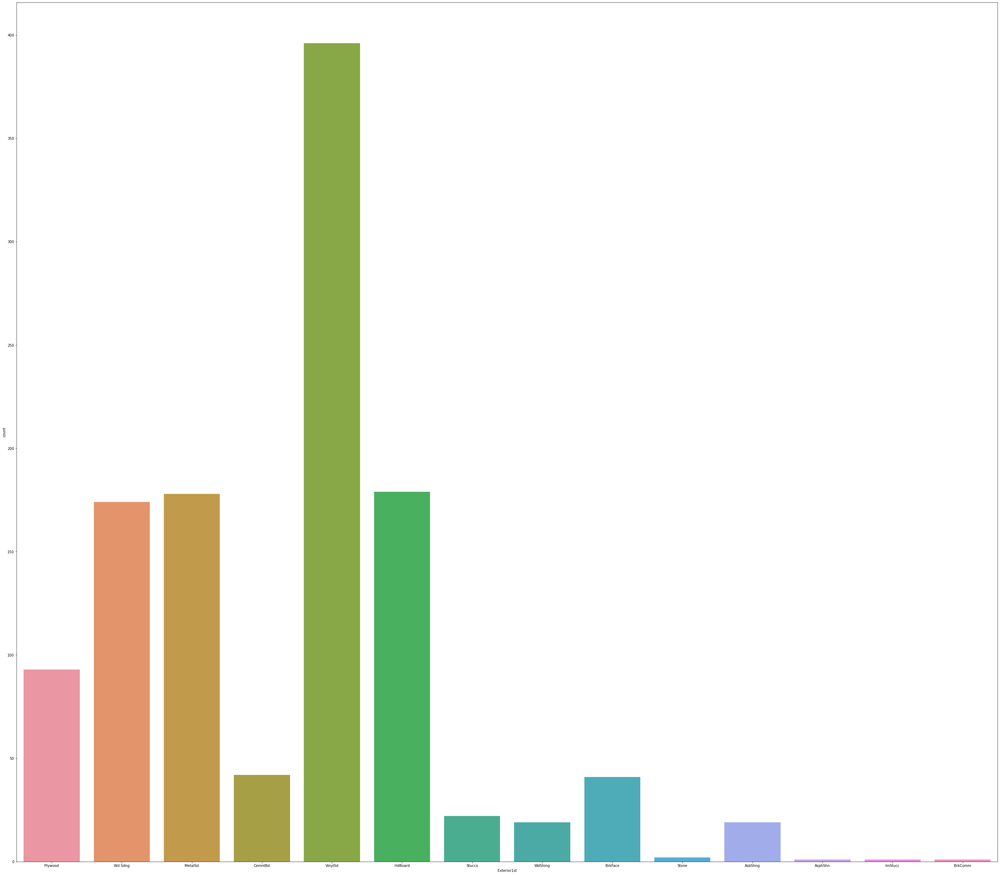

In [58]:
plt.figure(figsize=(50,45))
sns.countplot('Exterior1st',data=df)

<AxesSubplot:xlabel='Exterior2nd', ylabel='count'>

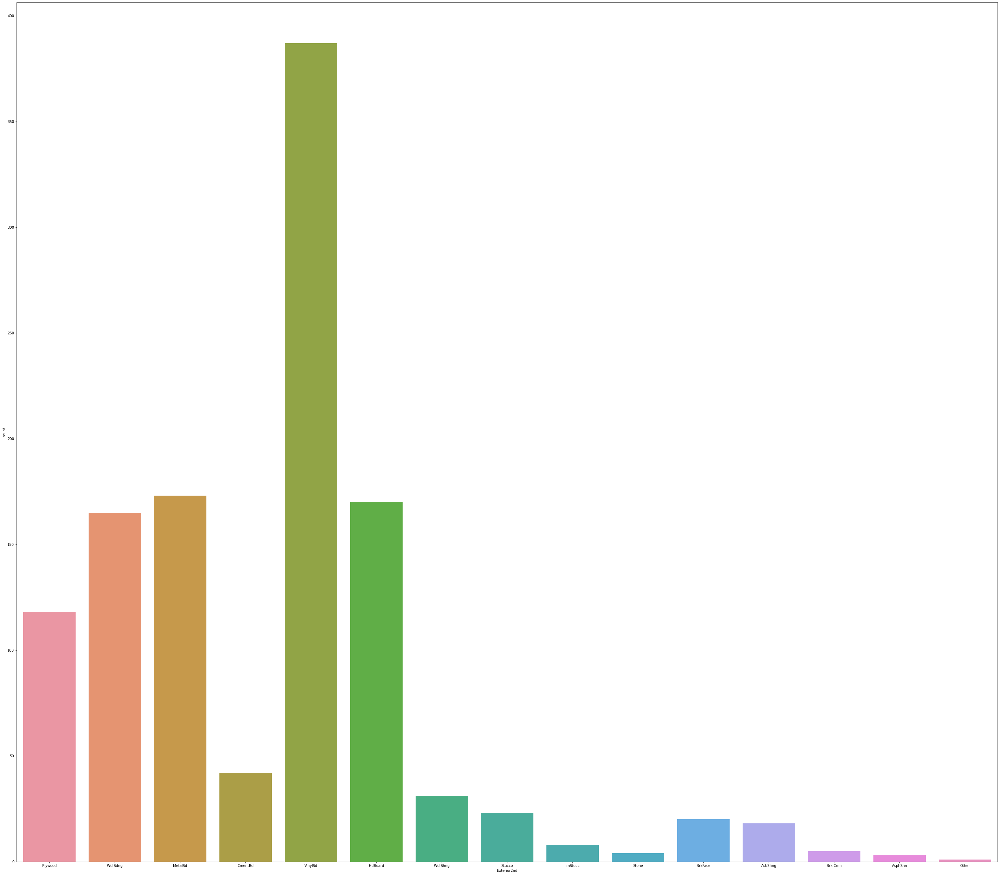

In [59]:
plt.figure(figsize=(50,45))
sns.countplot(x='Exterior2nd',data=df)

<AxesSubplot:xlabel='Foundation', ylabel='count'>

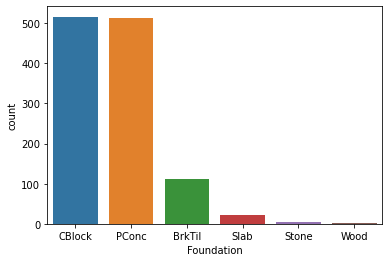

In [60]:
sns.countplot(x='Foundation',data=df)

<AxesSubplot:xlabel='HeatingQC', ylabel='count'>

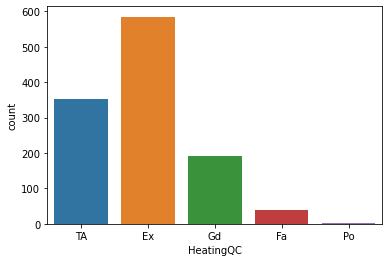

In [61]:
sns.countplot(x='HeatingQC',data=df)

<AxesSubplot:xlabel='KitchenQual', ylabel='count'>

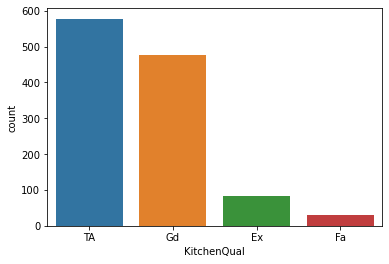

In [62]:
sns.countplot(x='KitchenQual',data=df)

<AxesSubplot:xlabel='GarageType', ylabel='count'>

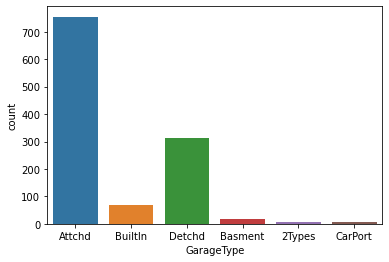

In [63]:
sns.countplot(x='GarageType',data=df)

<AxesSubplot:xlabel='SaleCondition', ylabel='count'>

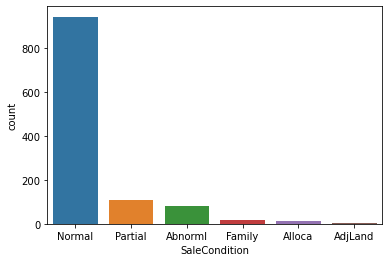

In [64]:
sns.countplot(x='SaleCondition',data=df)

<AxesSubplot:xlabel='KitchenQual', ylabel='SalePrice'>

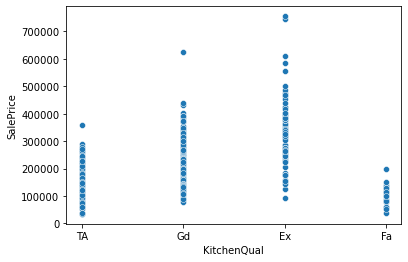

In [65]:
sns.scatterplot(x='KitchenQual',y='SalePrice',data=df)

<AxesSubplot:xlabel='GarageType', ylabel='SalePrice'>

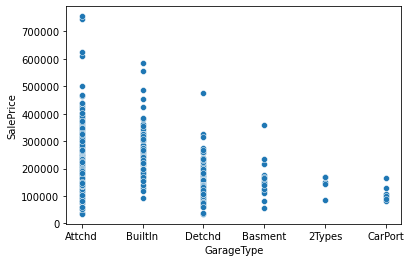

In [66]:
sns.scatterplot(x='GarageType',y='SalePrice',data=df)

<AxesSubplot:xlabel='HeatingQC', ylabel='SalePrice'>

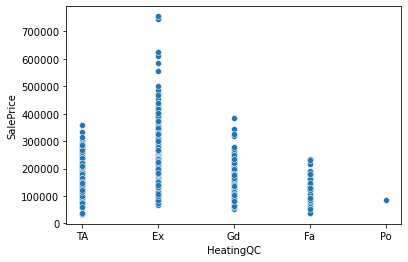

In [67]:
sns.scatterplot(x='HeatingQC',y='SalePrice',data=df)

<AxesSubplot:xlabel='Foundation', ylabel='SalePrice'>

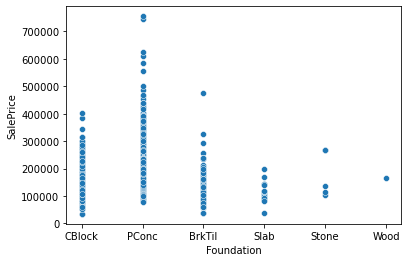

In [68]:
sns.scatterplot(x='Foundation',y='SalePrice',data=df)

<AxesSubplot:xlabel='RoofStyle', ylabel='SalePrice'>

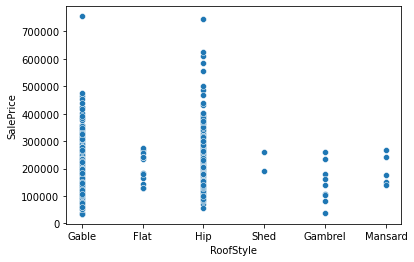

In [69]:
sns.scatterplot(x="RoofStyle",y="SalePrice",data=df)

<AxesSubplot:xlabel='HouseStyle', ylabel='SalePrice'>

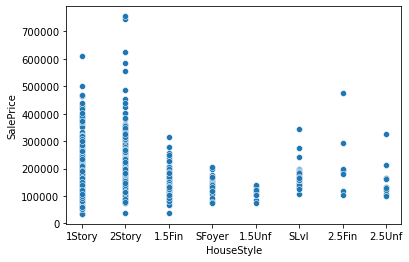

In [70]:
sns.scatterplot(x="HouseStyle",y="SalePrice",data=df)

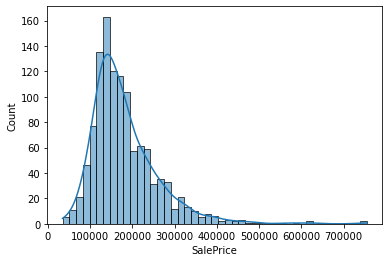

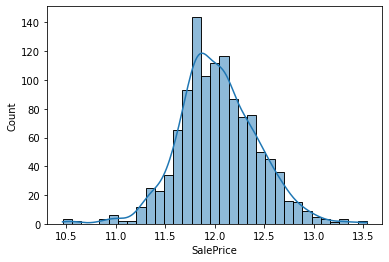

In [71]:
sns.histplot(df['SalePrice'], kde=True)
plt.show()


sns.histplot(np.log(df['SalePrice']), kde=True)
plt.show()

In [72]:
# as 3 features are providing same information as 1 feature, lets drop those 3 features and have that 1 

df.drop(['BsmtFinSF1','BsmtFinSF2','BsmtUnfSF'], axis=1, inplace=True)

In [73]:
df.shape

(1168, 71)

<AxesSubplot:>

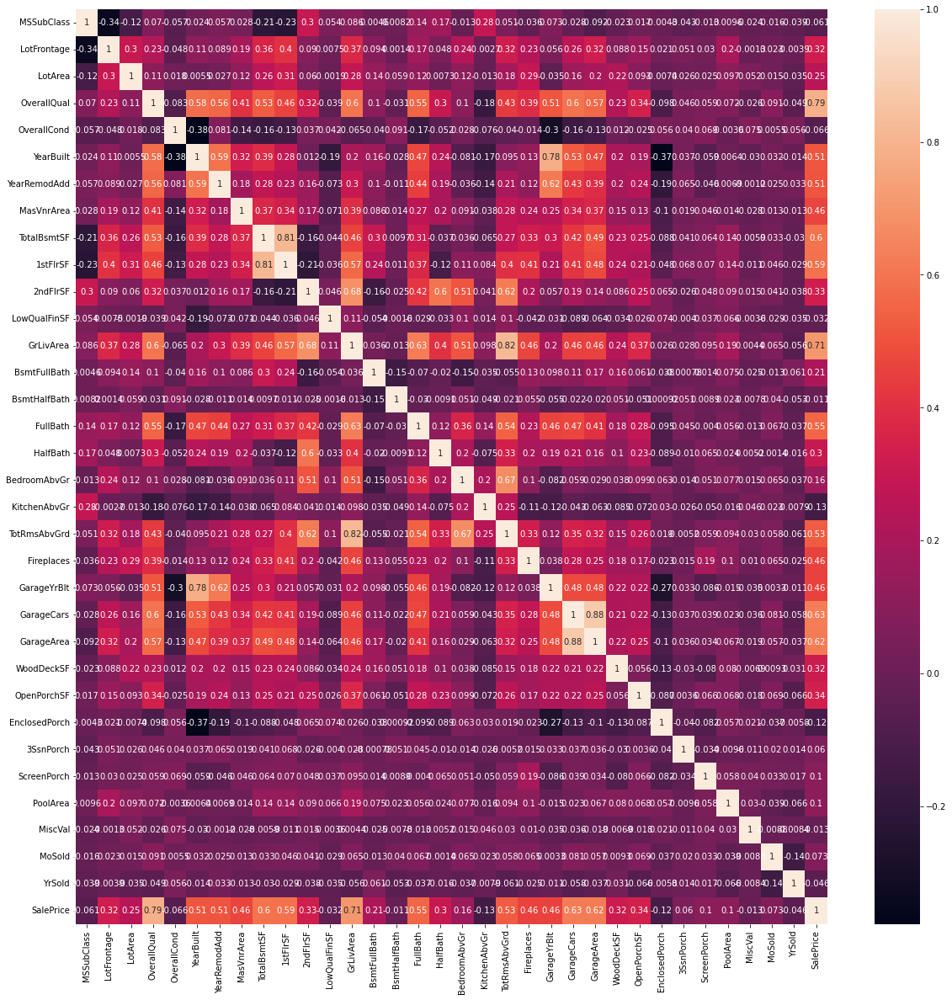

In [74]:
plt.figure(figsize=(20,20))
sns.heatmap(df.corr(),annot=True)

In [75]:
continuous= [x for x in df.columns if df[x].dtypes!='O']
categorical= [x for x in df.columns if df[x].dtypes=='O']

In [76]:
len(continuous), len(categorical), df.shape[1]

(34, 37, 71)

In [77]:
df.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinType2,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,120,RL,70.98847,4928,Pave,IR1,Lvl,Inside,Gtl,NPkVill,Norm,Norm,TwnhsE,1Story,6,5,1976,1976,Gable,CompShg,Plywood,Plywood,None,0.0,TA,TA,CBlock,Gd,TA,No,ALQ,Unf,1078,GasA,TA,Y,SBrkr,958,0,0,958,0,0,2,0,2,1,TA,5,Typ,1,Attchd,1977.0,RFn,2,440,TA,TA,Y,0,205,0,0,0,0,0,2,2007,WD,Normal,128000
1,20,RL,95.00000,15865,Pave,IR1,Lvl,Inside,Mod,NAmes,Norm,Norm,1Fam,1Story,8,6,1970,1970,Flat,Tar&Grv,Wd Sdng,Wd Sdng,None,0.0,Gd,Gd,PConc,TA,Gd,Gd,ALQ,Rec,2217,GasA,Ex,Y,SBrkr,2217,0,0,2217,1,0,2,0,4,1,Gd,8,Typ,1,Attchd,1970.0,Unf,2,621,TA,TA,Y,81,207,0,0,224,0,0,10,2007,WD,Normal,268000
2,60,RL,92.00000,9920,Pave,IR1,Lvl,CulDSac,Gtl,NoRidge,Norm,Norm,1Fam,2Story,7,5,1996,1997,Gable,CompShg,MetalSd,MetalSd,None,0.0,Gd,TA,PConc,Gd,TA,Av,GLQ,Unf,1117,GasA,Ex,Y,SBrkr,1127,886,0,2013,1,0,2,1,3,1,TA,8,Typ,1,Attchd,1997.0,Unf,2,455,TA,TA,Y,180,130,0,0,0,0,0,6,2007,WD,Normal,269790
3,20,RL,105.00000,11751,Pave,IR1,Lvl,Inside,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6,6,1977,1977,Hip,CompShg,Plywood,Plywood,BrkFace,480.0,TA,TA,CBlock,Gd,TA,No,BLQ,Unf,1844,GasA,Ex,Y,SBrkr,1844,0,0,1844,0,0,2,0,3,1,TA,7,Typ,1,Attchd,1977.0,RFn,2,546,TA,TA,Y,0,122,0,0,0,0,0,1,2010,COD,Normal,190000
4,20,RL,70.98847,16635,Pave,IR1,Lvl,FR2,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6,7,1977,2000,Gable,CompShg,CemntBd,CmentBd,Stone,126.0,Gd,TA,CBlock,Gd,TA,No,ALQ,Unf,1602,GasA,Gd,Y,SBrkr,1602,0,0,1602,0,1,2,0,3,1,Gd,8,Typ,1,Attchd,1977.0,Fin,2,529,TA,TA,Y,240,0,0,0,0,0,0,6,2009,WD,Normal,215000


In [78]:
df.isnull().sum().sum()

0

# outliers

In [79]:
# Basically, we check and handle outliers in continuous features only

# There are many methods to check outliers, we use here BoxPlot

df[continuous]

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
0,120,70.98847,4928,6,5,1976,1976,0.000000,1078,958,0,0,958,0,0,2,0,2,1,5,1,1977.000000,2,440,0,205,0,0,0,0,0,2,2007,128000
1,20,95.00000,15865,8,6,1970,1970,0.000000,2217,2217,0,0,2217,1,0,2,0,4,1,8,1,1970.000000,2,621,81,207,0,0,224,0,0,10,2007,268000
2,60,92.00000,9920,7,5,1996,1997,0.000000,1117,1127,886,0,2013,1,0,2,1,3,1,8,1,1997.000000,2,455,180,130,0,0,0,0,0,6,2007,269790
3,20,105.00000,11751,6,6,1977,1977,480.000000,1844,1844,0,0,1844,0,0,2,0,3,1,7,1,1977.000000,2,546,0,122,0,0,0,0,0,1,2010,190000
4,20,70.98847,16635,6,7,1977,2000,126.000000,1602,1602,0,0,1602,0,1,2,0,3,1,8,1,1977.000000,2,529,240,0,0,0,0,0,0,6,2009,215000
5,60,58.00000,14054,7,5,2006,2006,0.000000,879,879,984,0,1863,0,0,2,1,4,1,9,1,2006.000000,3,660,100,17,0,0,0,0,0,11,2006,219210
6,20,70.98847,11341,5,6,1957,1996,180.000000,1392,1392,0,0,1392,1,0,1,1,3,1,5,1,1957.000000,2,528,0,0,0,0,95,0,0,5,2010,121500
7,20,88.00000,13125,5,4,1957,2000,67.000000,1134,1803,0,0,1803,1,0,2,0,3,1,8,1,1957.000000,2,484,0,0,0,0,0,0,0,1,2006,155000
8,20,70.00000,9170,5,7,1965,1965,0.000000,1214,1214,0,0,1214,1,0,1,0,2,1,6,0,1965.000000,2,461,0,0,184,0,0,0,400,4,2007,140000
9,50,80.00000,8480,5,5,1947,1950,0.000000,832,832,384,0,1216,0,0,1,0,2,1,6,0,1947.000000,1,336,158,0,102,0,0,0,0,10,2008,118500


In [80]:
df['HouseAge']= df['YrSold']-df['YearBuilt']
df['ModificationAge']=df['YrSold']-df['YearRemodAdd']
df['GarageAge']=df['YrSold']-df['GarageYrBlt']

In [81]:
# So now, we can drop the year feature

df.drop(['YearBuilt','YearRemodAdd','GarageYrBlt','YrSold'], axis=1, inplace=True)

In [82]:
df[[x for x in df.columns if df[x].dtypes !='O' ]]

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,MasVnrArea,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,SalePrice,HouseAge,ModificationAge,GarageAge
0,120,70.98847,4928,6,5,0.000000,1078,958,0,0,958,0,0,2,0,2,1,5,1,2,440,0,205,0,0,0,0,0,2,128000,31,31,30.000000
1,20,95.00000,15865,8,6,0.000000,2217,2217,0,0,2217,1,0,2,0,4,1,8,1,2,621,81,207,0,0,224,0,0,10,268000,37,37,37.000000
2,60,92.00000,9920,7,5,0.000000,1117,1127,886,0,2013,1,0,2,1,3,1,8,1,2,455,180,130,0,0,0,0,0,6,269790,11,10,10.000000
3,20,105.00000,11751,6,6,480.000000,1844,1844,0,0,1844,0,0,2,0,3,1,7,1,2,546,0,122,0,0,0,0,0,1,190000,33,33,33.000000
4,20,70.98847,16635,6,7,126.000000,1602,1602,0,0,1602,0,1,2,0,3,1,8,1,2,529,240,0,0,0,0,0,0,6,215000,32,9,32.000000
5,60,58.00000,14054,7,5,0.000000,879,879,984,0,1863,0,0,2,1,4,1,9,1,3,660,100,17,0,0,0,0,0,11,219210,0,0,0.000000
6,20,70.98847,11341,5,6,180.000000,1392,1392,0,0,1392,1,0,1,1,3,1,5,1,2,528,0,0,0,0,95,0,0,5,121500,53,14,53.000000
7,20,88.00000,13125,5,4,67.000000,1134,1803,0,0,1803,1,0,2,0,3,1,8,1,2,484,0,0,0,0,0,0,0,1,155000,49,6,49.000000
8,20,70.00000,9170,5,7,0.000000,1214,1214,0,0,1214,1,0,1,0,2,1,6,0,2,461,0,0,184,0,0,0,400,4,140000,42,42,42.000000
9,50,80.00000,8480,5,5,0.000000,832,832,384,0,1216,0,0,1,0,2,1,6,0,1,336,158,0,102,0,0,0,0,10,118500,61,58,61.000000


<function matplotlib.pyplot.show(close=None, block=None)>

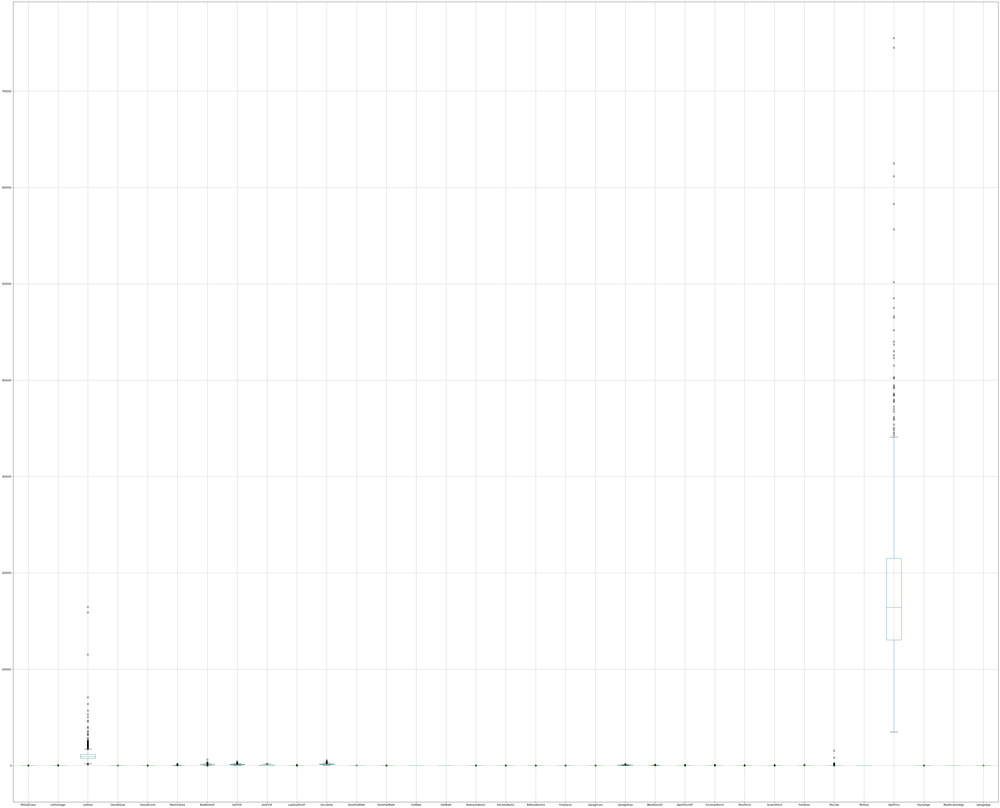

In [83]:
df.boxplot(figsize=[70,70])
plt.subplots_adjust(bottom=0.25)
plt.show

In [84]:
# many continuous features are is categorical in nature, we have to avoid outlier detection on those features

outlier=['LotFrontage','LotArea','MasVnrArea','TotalBsmtSF','1stFlrSF','2ndFlrSF','LowQualFinSF','GrLivArea','GarageArea','WoodDeckSF','OpenPorchSF','MoSold','HouseAge','ModificationAge','GarageAge']

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


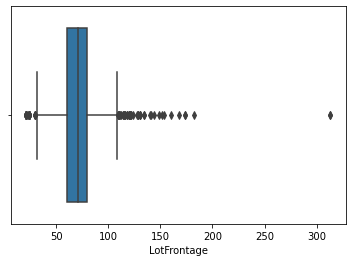

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


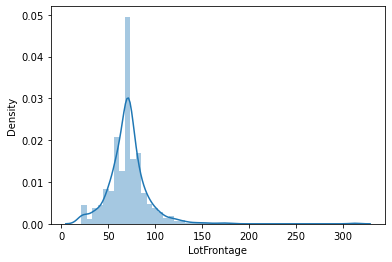

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


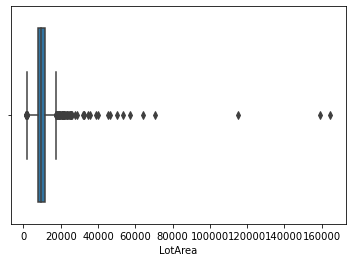

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


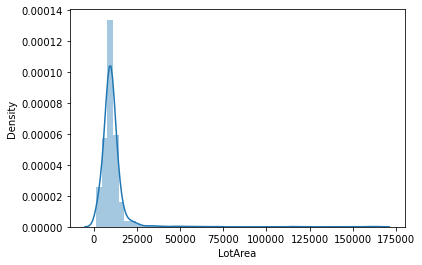

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


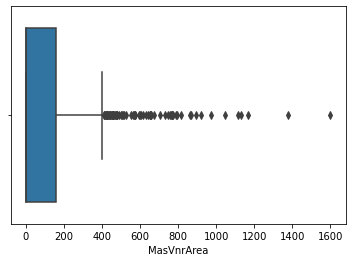

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


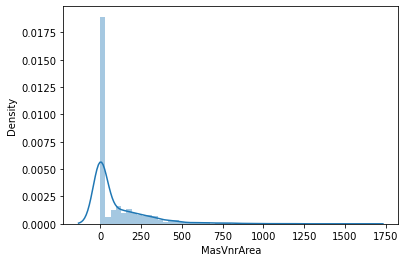

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


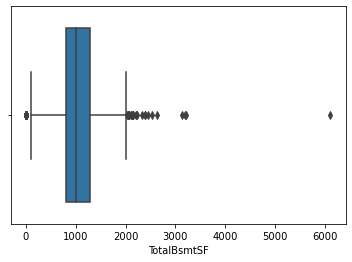

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


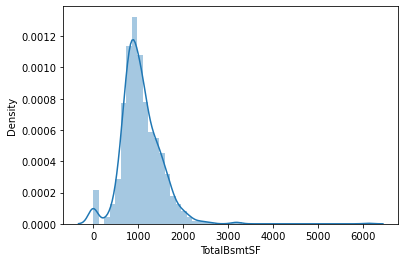

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


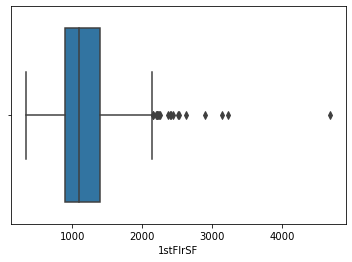

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


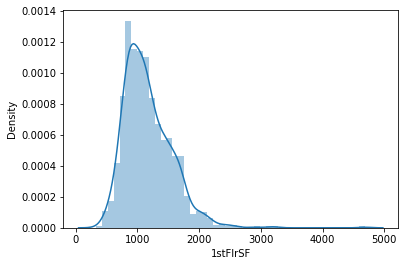

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


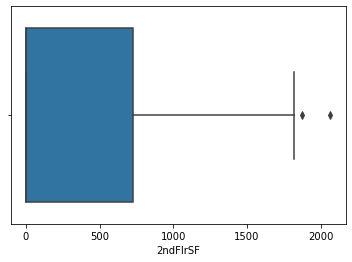

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


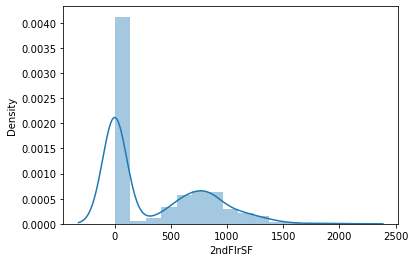

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


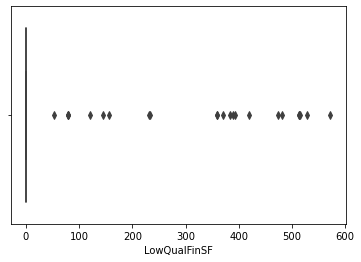

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


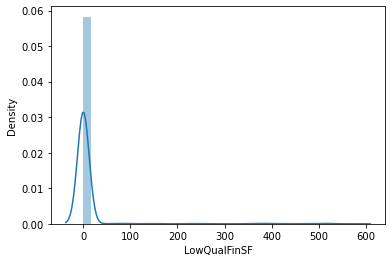

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


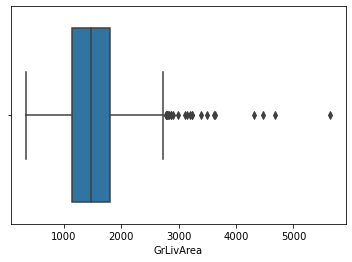

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


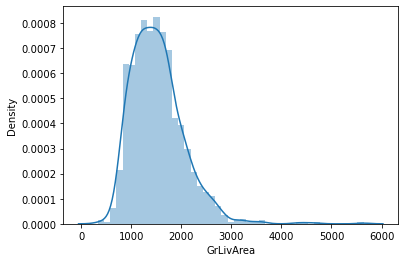

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


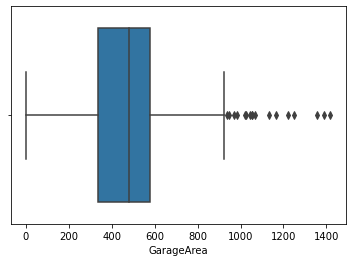

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


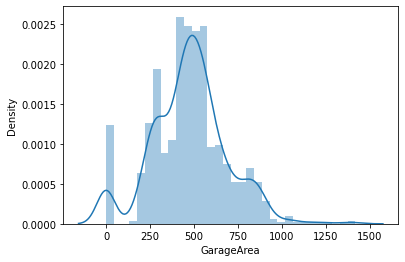

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


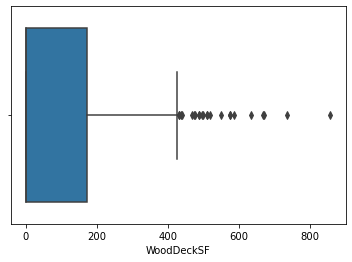

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


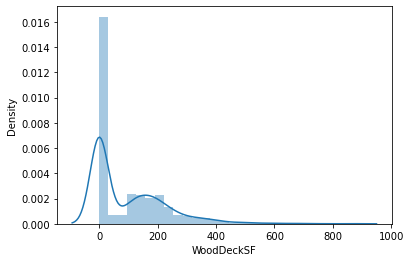

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


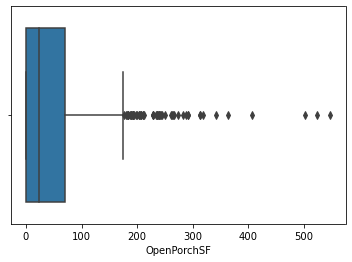

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


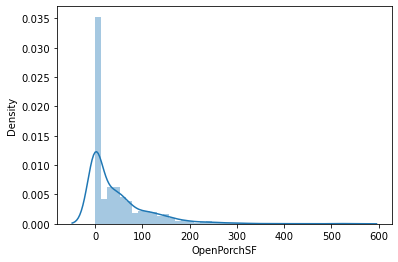

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


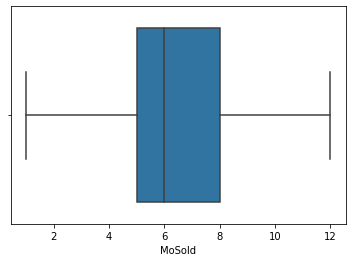

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


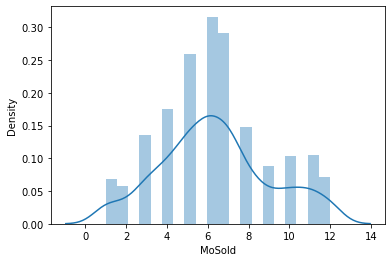

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


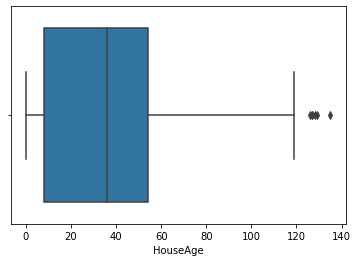

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


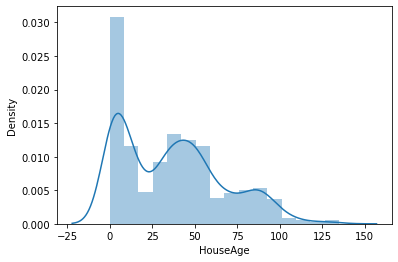

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


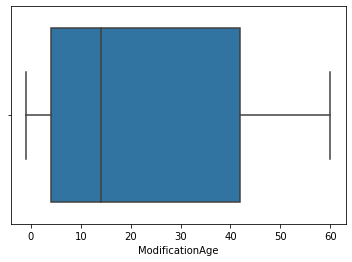

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


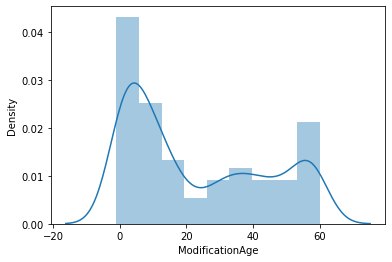

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


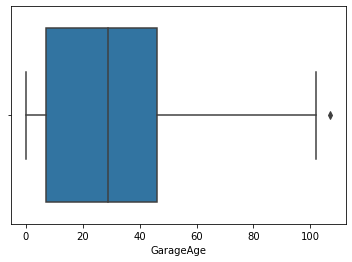

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


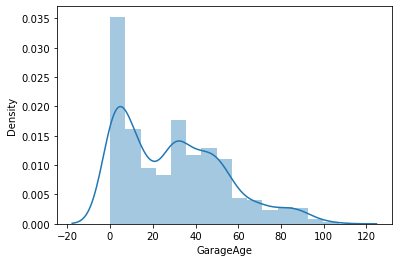

In [85]:
for i in outlier:
    sns.boxplot(df[i])
    plt.show()
    sns.distplot(df[i])
    plt.show()

In [86]:
df[outlier].skew()

LotFrontage         2.710383
LotArea            10.659285
MasVnrArea          2.834658
TotalBsmtSF         1.744591
1stFlrSF            1.513707
2ndFlrSF            0.823479
LowQualFinSF        8.666142
GrLivArea           1.449952
GarageArea          0.189665
WoodDeckSF          1.504929
OpenPorchSF         2.410840
MoSold              0.220979
HouseAge            0.573127
ModificationAge     0.495051
GarageAge           0.652898
dtype: float64

# Outliers handle by IQR

In [87]:
for i in outlier:
    IQR= df[i].quantile(.75)-df[i].quantile(.25)
    lower=df[i].quantile(.25) - (1.5 * IQR)
    upper=df[i].quantile(.75) + (1.5 * IQR)
    df[i]=np.where(df[i]<lower,lower,df[i])
    df[i]=np.where(df[i]>upper,upper,df[i])

In [88]:
df[outlier].skew()

LotFrontage        0.038554
LotArea            0.184194
MasVnrArea         1.287681
TotalBsmtSF        0.243671
1stFlrSF           0.663710
2ndFlrSF           0.808038
LowQualFinSF       0.000000
GrLivArea          0.587651
GarageArea        -0.107166
WoodDeckSF         1.060148
OpenPorchSF        1.154030
MoSold             0.220979
HouseAge           0.555132
ModificationAge    0.495051
GarageAge          0.651526
dtype: float64

In [89]:
df.head(5)

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinType2,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,GarageType,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,SaleType,SaleCondition,SalePrice,HouseAge,ModificationAge,GarageAge
0,120,RL,70.98847,4928.0,Pave,IR1,Lvl,Inside,Gtl,NPkVill,Norm,Norm,TwnhsE,1Story,6,5,Gable,CompShg,Plywood,Plywood,None,0.0,TA,TA,CBlock,Gd,TA,No,ALQ,Unf,1078.00,GasA,TA,Y,SBrkr,958.0,0.0,0.0,958.0,0,0,2,0,2,1,TA,5,Typ,1,Attchd,RFn,2,440.0,TA,TA,Y,0.0,175.0,0,0,0,0,0,2.0,WD,Normal,128000,31.0,31.0,30.0
1,20,RL,95.00000,15865.0,Pave,IR1,Lvl,Inside,Mod,NAmes,Norm,Norm,1Fam,1Story,8,6,Flat,Tar&Grv,Wd Sdng,Wd Sdng,None,0.0,Gd,Gd,PConc,TA,Gd,Gd,ALQ,Rec,2030.25,GasA,Ex,Y,SBrkr,2142.0,0.0,0.0,2217.0,1,0,2,0,4,1,Gd,8,Typ,1,Attchd,Unf,2,621.0,TA,TA,Y,81.0,175.0,0,0,224,0,0,10.0,WD,Normal,268000,37.0,37.0,37.0
2,60,RL,92.00000,9920.0,Pave,IR1,Lvl,CulDSac,Gtl,NoRidge,Norm,Norm,1Fam,2Story,7,5,Gable,CompShg,MetalSd,MetalSd,None,0.0,Gd,TA,PConc,Gd,TA,Av,GLQ,Unf,1117.00,GasA,Ex,Y,SBrkr,1127.0,886.0,0.0,2013.0,1,0,2,1,3,1,TA,8,Typ,1,Attchd,Unf,2,455.0,TA,TA,Y,180.0,130.0,0,0,0,0,0,6.0,WD,Normal,269790,11.0,10.0,10.0
3,20,RL,105.00000,11751.0,Pave,IR1,Lvl,Inside,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6,6,Hip,CompShg,Plywood,Plywood,BrkFace,400.0,TA,TA,CBlock,Gd,TA,No,BLQ,Unf,1844.00,GasA,Ex,Y,SBrkr,1844.0,0.0,0.0,1844.0,0,0,2,0,3,1,TA,7,Typ,1,Attchd,RFn,2,546.0,TA,TA,Y,0.0,122.0,0,0,0,0,0,1.0,COD,Normal,190000,33.0,33.0,33.0
4,20,RL,70.98847,16635.0,Pave,IR1,Lvl,FR2,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6,7,Gable,CompShg,CemntBd,CmentBd,Stone,126.0,Gd,TA,CBlock,Gd,TA,No,ALQ,Unf,1602.00,GasA,Gd,Y,SBrkr,1602.0,0.0,0.0,1602.0,0,1,2,0,3,1,Gd,8,Typ,1,Attchd,Fin,2,529.0,TA,TA,Y,240.0,0.0,0,0,0,0,0,6.0,WD,Normal,215000,32.0,9.0,32.0


In [90]:
df.shape

(1168, 70)

In [91]:
continuous= [x for x in df.columns if df[x].dtypes!='O']
categorical= [x for x in df.columns if df[x].dtypes=='O']

In [92]:
df[continuous].shape , df[categorical].shape

((1168, 33), (1168, 37))

In [93]:
df[continuous]

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,MasVnrArea,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,SalePrice,HouseAge,ModificationAge,GarageAge
0,120,70.98847,4928.0,6,5,0.000000,1078.00,958.0,0.0,0.0,958.000,0,0,2,0,2,1,5,1,2,440.0,0.0,175.0,0,0,0,0,0,2.0,128000,31.0,31.0,30.000000
1,20,95.00000,15865.0,8,6,0.000000,2030.25,2142.0,0.0,0.0,2217.000,1,0,2,0,4,1,8,1,2,621.0,81.0,175.0,0,0,224,0,0,10.0,268000,37.0,37.0,37.000000
2,60,92.00000,9920.0,7,5,0.000000,1117.00,1127.0,886.0,0.0,2013.000,1,0,2,1,3,1,8,1,2,455.0,180.0,130.0,0,0,0,0,0,6.0,269790,11.0,10.0,10.000000
3,20,105.00000,11751.0,6,6,400.000000,1844.00,1844.0,0.0,0.0,1844.000,0,0,2,0,3,1,7,1,2,546.0,0.0,122.0,0,0,0,0,0,1.0,190000,33.0,33.0,33.000000
4,20,70.98847,16635.0,6,7,126.000000,1602.00,1602.0,0.0,0.0,1602.000,0,1,2,0,3,1,8,1,2,529.0,240.0,0.0,0,0,0,0,0,6.0,215000,32.0,9.0,32.000000
5,60,58.00000,14054.0,7,5,0.000000,879.00,879.0,984.0,0.0,1863.000,0,0,2,1,4,1,9,1,3,660.0,100.0,17.0,0,0,0,0,0,11.0,219210,0.0,0.0,0.000000
6,20,70.98847,11341.0,5,6,180.000000,1392.00,1392.0,0.0,0.0,1392.000,1,0,1,1,3,1,5,1,2,528.0,0.0,0.0,0,0,95,0,0,5.0,121500,53.0,14.0,53.000000
7,20,88.00000,13125.0,5,4,67.000000,1134.00,1803.0,0.0,0.0,1803.000,1,0,2,0,3,1,8,1,2,484.0,0.0,0.0,0,0,0,0,0,1.0,155000,49.0,6.0,49.000000
8,20,70.00000,9170.0,5,7,0.000000,1214.00,1214.0,0.0,0.0,1214.000,1,0,1,0,2,1,6,0,2,461.0,0.0,0.0,184,0,0,0,400,4.0,140000,42.0,42.0,42.000000
9,50,80.00000,8480.0,5,5,0.000000,832.00,832.0,384.0,0.0,1216.000,0,0,1,0,2,1,6,0,1,336.0,158.0,0.0,102,0,0,0,0,10.0,118500,61.0,58.0,61.000000


# now Encoding

In [94]:
df[categorical].head(5)

,MSZoning,Street,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinType2,Heating,HeatingQC,CentralAir,Electrical,KitchenQual,Functional,GarageType,GarageFinish,GarageQual,GarageCond,PavedDrive,SaleType,SaleCondition
0,RL,Pave,IR1,Lvl,Inside,Gtl,NPkVill,Norm,Norm,TwnhsE,1Story,Gable,CompShg,Plywood,Plywood,None,TA,TA,CBlock,Gd,TA,No,ALQ,Unf,GasA,TA,Y,SBrkr,TA,Typ,Attchd,RFn,TA,TA,Y,WD,Normal
1,RL,Pave,IR1,Lvl,Inside,Mod,NAmes,Norm,Norm,1Fam,1Story,Flat,Tar&Grv,Wd Sdng,Wd Sdng,None,Gd,Gd,PConc,TA,Gd,Gd,ALQ,Rec,GasA,Ex,Y,SBrkr,Gd,Typ,Attchd,Unf,TA,TA,Y,WD,Normal
2,RL,Pave,IR1,Lvl,CulDSac,Gtl,NoRidge,Norm,Norm,1Fam,2Story,Gable,CompShg,MetalSd,MetalSd,None,Gd,TA,PConc,Gd,TA,Av,GLQ,Unf,GasA,Ex,Y,SBrkr,TA,Typ,Attchd,Unf,TA,TA,Y,WD,Normal
3,RL,Pave,IR1,Lvl,Inside,Gtl,NWAmes,Norm,Norm,1Fam,1Story,Hip,CompShg,Plywood,Plywood,BrkFace,TA,TA,CBlock,Gd,TA,No,BLQ,Unf,GasA,Ex,Y,SBrkr,TA,Typ,Attchd,RFn,TA,TA,Y,COD,Normal
4,RL,Pave,IR1,Lvl,FR2,Gtl,NWAmes,Norm,Norm,1Fam,1Story,Gable,CompShg,CemntBd,CmentBd,Stone,Gd,TA,CBlock,Gd,TA,No,ALQ,Unf,GasA,Gd,Y,SBrkr,Gd,Typ,Attchd,Fin,TA,TA,Y,WD,Normal


Some of will be nominal and some will be ordinal in category, we have to encode accordingly

In [95]:
for i in categorical:
    print(i)
    print(df[i].unique())
    print('*' * 50)

MSZoning
['RL' 'RM' 'FV' 'RH' 'C (all)']
**************************************************
Street
['Pave' 'Grvl']
**************************************************
LotShape
['IR1' 'Reg' 'IR2' 'IR3']
**************************************************
LandContour
['Lvl' 'Bnk' 'HLS' 'Low']
**************************************************
LotConfig
['Inside' 'CulDSac' 'FR2' 'Corner' 'FR3']
**************************************************
LandSlope
['Gtl' 'Mod' 'Sev']
**************************************************
Neighborhood
['NPkVill' 'NAmes' 'NoRidge' 'NWAmes' 'Gilbert' 'Sawyer' 'Edwards'
 'IDOTRR' 'CollgCr' 'Mitchel' 'Crawfor' 'BrDale' 'StoneBr' 'BrkSide'
 'NridgHt' 'OldTown' 'Somerst' 'Timber' 'SWISU' 'SawyerW' 'ClearCr'
 'Veenker' 'Blmngtn' 'MeadowV' 'Blueste']
**************************************************
Condition1
['Norm' 'Feedr' 'RRAn' 'PosA' 'RRAe' 'Artery' 'PosN' 'RRNe' 'RRNn']
**************************************************
Condition2
['Norm' 'RRAe' 'Feedr' '

In [96]:
ordinal_cols = {
    'ExterQual':{'Ex':5,'Gd':4,'TA':3,'Fa':2},
    'ExterCond':{'Ex':5,'Gd':4,'TA':3,'Fa':2,'Po':1},
    'BsmtQual': {'Ex':5,'Gd':4,'TA':3,'Fa':2},
    'BsmtCond' : {'Gd':4,'TA':3,'Fa':2,'Po':1},
    'BsmtExposure' : {'Gd':5,'Av':4,'Mn':3,'No':2,'NA':1},
    'BsmtFinType1' : {'GLQ':7,'ALQ':6,'BLQ':5,'Rec':4,'LwQ':3,'Unf':2,'NA':1},
    'BsmtFinType2' : {'GLQ':7,'ALQ':6,'BLQ':5,'Rec':4,'LwQ':3,'Unf':2,'NA':1},
    'HeatingQC' :{'Ex':5,'Gd':4,'TA':3,'Fa':2,'Po':1  },
    'KitchenQual':{'Ex':5,'Gd':4,'TA':3,'Fa':2,'Po':1 },
    'GarageQual':{'Ex':5,'Gd':4,'TA':3,'Fa':2,'Po':1 },
    'GarageCond':{'Ex':5,'Gd':4,'TA':3,'Fa':2,'Po':1 },
    'GarageFinish' : {'Fin':3,'RFn':2,'Unf':1},
    
      
    
    
    'Utilities' : {'AllPub':4,'NoSewr':3,'NoSeWa':2,'ELO':1}
}

In [97]:
df.replace(ordinal_cols, inplace = True)

In [98]:
df.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinType2,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,GarageType,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,SaleType,SaleCondition,SalePrice,HouseAge,ModificationAge,GarageAge
0,120,RL,70.98847,4928.0,Pave,IR1,Lvl,Inside,Gtl,NPkVill,Norm,Norm,TwnhsE,1Story,6,5,Gable,CompShg,Plywood,Plywood,None,0.0,3,3,CBlock,4,3,2,6,2,1078.00,GasA,3,Y,SBrkr,958.0,0.0,0.0,958.0,0,0,2,0,2,1,3,5,Typ,1,Attchd,2,2,440.0,3,3,Y,0.0,175.0,0,0,0,0,0,2.0,WD,Normal,128000,31.0,31.0,30.0
1,20,RL,95.00000,15865.0,Pave,IR1,Lvl,Inside,Mod,NAmes,Norm,Norm,1Fam,1Story,8,6,Flat,Tar&Grv,Wd Sdng,Wd Sdng,None,0.0,4,4,PConc,3,4,5,6,4,2030.25,GasA,5,Y,SBrkr,2142.0,0.0,0.0,2217.0,1,0,2,0,4,1,4,8,Typ,1,Attchd,1,2,621.0,3,3,Y,81.0,175.0,0,0,224,0,0,10.0,WD,Normal,268000,37.0,37.0,37.0
2,60,RL,92.00000,9920.0,Pave,IR1,Lvl,CulDSac,Gtl,NoRidge,Norm,Norm,1Fam,2Story,7,5,Gable,CompShg,MetalSd,MetalSd,None,0.0,4,3,PConc,4,3,4,7,2,1117.00,GasA,5,Y,SBrkr,1127.0,886.0,0.0,2013.0,1,0,2,1,3,1,3,8,Typ,1,Attchd,1,2,455.0,3,3,Y,180.0,130.0,0,0,0,0,0,6.0,WD,Normal,269790,11.0,10.0,10.0
3,20,RL,105.00000,11751.0,Pave,IR1,Lvl,Inside,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6,6,Hip,CompShg,Plywood,Plywood,BrkFace,400.0,3,3,CBlock,4,3,2,5,2,1844.00,GasA,5,Y,SBrkr,1844.0,0.0,0.0,1844.0,0,0,2,0,3,1,3,7,Typ,1,Attchd,2,2,546.0,3,3,Y,0.0,122.0,0,0,0,0,0,1.0,COD,Normal,190000,33.0,33.0,33.0
4,20,RL,70.98847,16635.0,Pave,IR1,Lvl,FR2,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6,7,Gable,CompShg,CemntBd,CmentBd,Stone,126.0,4,3,CBlock,4,3,2,6,2,1602.00,GasA,4,Y,SBrkr,1602.0,0.0,0.0,1602.0,0,1,2,0,3,1,4,8,Typ,1,Attchd,3,2,529.0,3,3,Y,240.0,0.0,0,0,0,0,0,6.0,WD,Normal,215000,32.0,9.0,32.0


In [99]:
df.shape

(1168, 70)

In [100]:
encoded=pd.get_dummies(df)

In [101]:
encoded.shape

(1168, 220)

In [102]:
[x for x in encoded.columns if encoded[x].dtypes=='O']

[]

In [103]:
x= encoded.drop('SalePrice', axis=1)
y=encoded['SalePrice']

In [104]:
x.shape

(1168, 219)

In [105]:
y.shape

(1168,)

In [106]:
y.head()

0    128000
1    268000
2    269790
3    190000
4    215000
Name: SalePrice, dtype: int64

# Feature Selection

In [107]:
from sklearn.feature_selection import mutual_info_regression
mutual_info=mutual_info_regression(x,y)

In [108]:
mutual_info=pd.Series(mutual_info)
mutual_info.index= x.columns

In [109]:
(mutual_info.sort_values(ascending=False)!=0).count()

219

In [110]:
pd.DataFrame(mutual_info).value_counts(ascending=False)

0.000000    42
0.052362     1
0.028430     1
0.031425     1
0.033028     1
0.033057     1
0.033993     1
0.038302     1
0.040425     1
0.042171     1
0.043356     1
0.043552     1
0.043859     1
0.044089     1
0.044179     1
0.046610     1
0.047010     1
0.047162     1
0.047311     1
0.050336     1
0.051158     1
0.027837     1
0.026767     1
0.026607     1
0.020568     1
0.017428     1
0.018158     1
0.018435     1
0.018699     1
0.018729     1
0.018805     1
0.019719     1
0.019830     1
0.021031     1
0.026352     1
0.021222     1
0.022516     1
0.024367     1
0.024486     1
0.024571     1
0.024628     1
0.025702     1
0.026167     1
0.051182     1
0.056365     1
0.000062     1
0.058034     1
0.169346     1
0.174150     1
0.178302     1
0.184814     1
0.213957     1
0.236440     1
0.243269     1
0.258096     1
0.265372     1
0.266668     1
0.282601     1
0.299377     1
0.323735     1
0.325810     1
0.327851     1
0.344686     1
0.347768     1
0.364816     1
0.452815     1
0.165540  

In [111]:
219-53

166

<AxesSubplot:>

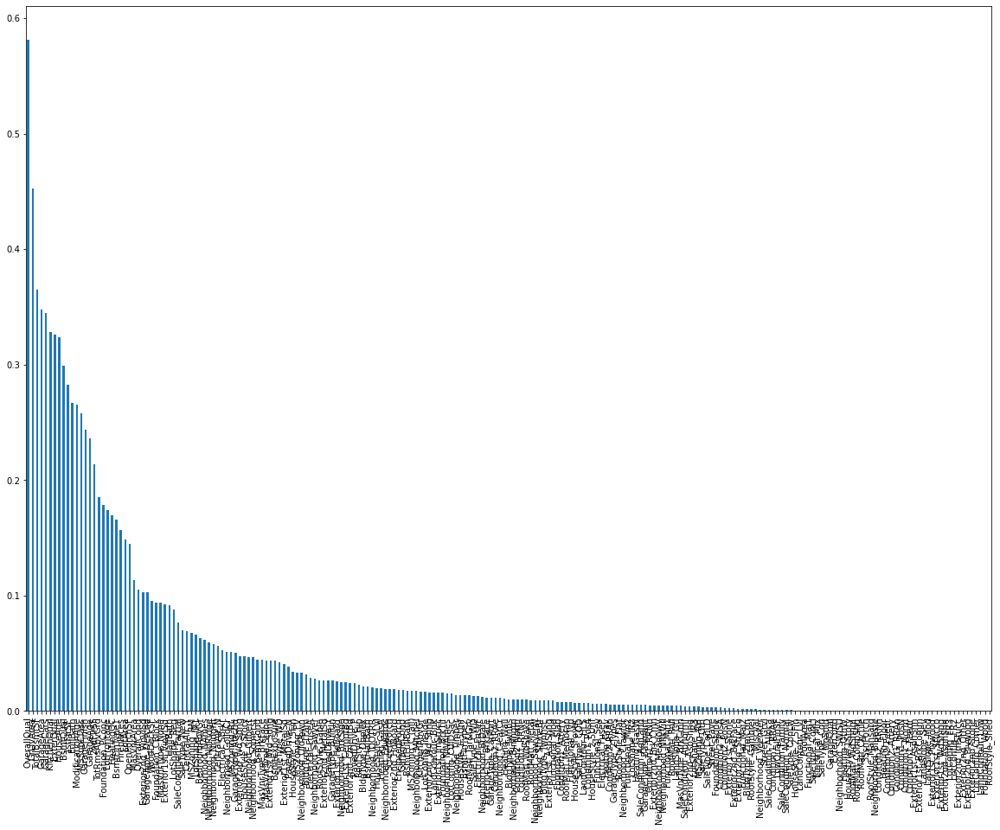

In [112]:
mutual_info.sort_values(ascending=False).plot.bar(figsize=(20,15))

In [113]:
from sklearn.feature_selection import SelectPercentile

In [114]:
selected=SelectPercentile(mutual_info_regression,percentile=76)

In [115]:
selected.fit(x,y)

SelectPercentile(percentile=76,
                 score_func=<function mutual_info_regression at 0x000002BFDBF92A60>)

In [116]:
selected.get_support()

array([ True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True, False,  True,  True,  True,  True,
       False,  True, False, False, False,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True, False,
        True,  True, False,  True, False, False,  True,  True,  True,
        True,  True,  True, False,  True, False,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True, False,  True,  True,  True,  True,
        True, False,  True,  True, False,  True,  True,  True, False,
        True,  True, False, False,  True,  True,  True,  True,  True,
       False,  True, False,  True,  True,  True,  True,  True, False,
       False,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,

In [117]:
selectedfeatures=x.columns[selected.get_support()]

In [118]:
len(selectedfeatures)

166

In [119]:
# Here , we have selected only the features have some dependency on target feature.
inputdata=x[selectedfeatures]

In [120]:
inputdata.shape

(1168, 166)

In [121]:
inputdata.head()

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,MasVnrArea,ExterQual,ExterCond,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinType2,TotalBsmtSF,HeatingQC,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Fireplaces,GarageFinish,GarageCars,GarageArea,GarageCond,WoodDeckSF,OpenPorchSF,EnclosedPorch,ScreenPorch,HouseAge,ModificationAge,GarageAge,MSZoning_C (all),MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,Street_Grvl,Street_Pave,LotShape_IR1,LotShape_IR2,LotShape_Reg,LandContour_Bnk,LandContour_Low,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,LandSlope_Gtl,LandSlope_Mod,Neighborhood_Blmngtn,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Condition1_Artery,Condition1_Feedr,Condition1_PosA,Condition1_PosN,Condition1_RRAe,Condition1_RRNe,Condition1_RRNn,Condition2_Norm,Condition2_PosA,Condition2_PosN,Condition2_RRAe,Condition2_RRAn,BldgType_1Fam,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE,HouseStyle_1.5Fin,HouseStyle_1.5Unf,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,RoofStyle_Flat,RoofStyle_Gable,RoofStyle_Gambrel,RoofStyle_Hip,RoofStyle_Mansard,RoofStyle_Shed,RoofMatl_ClyTile,RoofMatl_Metal,RoofMatl_WdShngl,Exterior1st_AsbShng,Exterior1st_AsphShn,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_ImStucc,Exterior1st_MetalSd,Exterior1st_Stone,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_AsbShng,Exterior2nd_AsphShn,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_MetalSd,Exterior2nd_Other,Exterior2nd_Plywood,Exterior2nd_Stone,Exterior2nd_Stucco,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,MasVnrType_BrkCmn,MasVnrType_BrkFace,MasVnrType_None,MasVnrType_Stone,Foundation_BrkTil,Foundation_CBlock,Foundation_PConc,Foundation_Slab,Heating_GasA,Heating_GasW,Heating_Grav,Heating_Wall,CentralAir_N,CentralAir_Y,Electrical_FuseA,Electrical_FuseF,Electrical_FuseP,Electrical_SBrkr,Functional_Min2,Functional_Mod,GarageType_Attchd,GarageType_BuiltIn,GarageType_CarPort,GarageType_Detchd,PavedDrive_N,PavedDrive_P,PavedDrive_Y,SaleType_COD,SaleType_New,SaleType_WD,SaleCondition_Abnorml,SaleCondition_Alloca,SaleCondition_Normal,SaleCondition_Partial
0,120,70.98847,4928.0,6,5,0.0,3,3,4,3,2,6,2,1078.00,3,958.0,0.0,0.0,958.0,0,0,2,0,2,1,3,5,1,2,2,440.0,3,0.0,175.0,0,0,31.0,31.0,30.0,0,0,0,1,0,0,1,1,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,1,0,0,1,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,0,0,1,0,0,1,0,0,1,0
1,20,95.00000,15865.0,8,6,0.0,4,4,3,4,5,6,4,2030.25,5,2142.0,0.0,0.0,2217.0,1,0,2,0,4,1,4,8,1,1,2,621.0,3,81.0,175.0,0,224,37.0,37.0,37.0,0,0,0,1,0,0,1,1,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,1,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,0,0,1,0,0,1,0,0,1,0
2,60,92.00000,9920.0,7,5,0.0,4,3,4,3,4,7,2,1117.00,5,1127.0,886.0,0.0,2013.0,1,0,2,1,3,1,3,8,1,1,2,455.0,3,180.0,130.0,0,0,11.0,10.0,10.0,0,0,0,1,0,0,1,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,1,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,0,0,1,0,0,1,0,0,1,0
3,20,105.00000,11751.0,6,6,400.0,3,3,4,3,2,5,2,1844.00,5,1844.0,0.0,0.0,1844.0,0,0,2,0,3,1,3,7,1,2,2,546.0,3,0.0,122.0,0,0,33.0,33.0,33.0,0,0,0,1,0,0,1,1,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0

In [122]:
#Lets remove skewness of some categorical features:
skew_feature=['LotFrontage','LotArea','TotalBsmtSF','1stFlrSF','GrLivArea']

In [123]:
for feature in skew_feature:
    inputdata[feature]= np.log(inputdata[feature])

C:\Users\Kavisha\AppData\Local\Temp\ipykernel_25504\2789758662.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inputdata[feature]= np.log(inputdata[feature])


In [124]:
inputdata.head()

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,MasVnrArea,ExterQual,ExterCond,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinType2,TotalBsmtSF,HeatingQC,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Fireplaces,GarageFinish,GarageCars,GarageArea,GarageCond,WoodDeckSF,OpenPorchSF,EnclosedPorch,ScreenPorch,HouseAge,ModificationAge,GarageAge,MSZoning_C (all),MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,Street_Grvl,Street_Pave,LotShape_IR1,LotShape_IR2,LotShape_Reg,LandContour_Bnk,LandContour_Low,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,LandSlope_Gtl,LandSlope_Mod,Neighborhood_Blmngtn,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Condition1_Artery,Condition1_Feedr,Condition1_PosA,Condition1_PosN,Condition1_RRAe,Condition1_RRNe,Condition1_RRNn,Condition2_Norm,Condition2_PosA,Condition2_PosN,Condition2_RRAe,Condition2_RRAn,BldgType_1Fam,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE,HouseStyle_1.5Fin,HouseStyle_1.5Unf,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,RoofStyle_Flat,RoofStyle_Gable,RoofStyle_Gambrel,RoofStyle_Hip,RoofStyle_Mansard,RoofStyle_Shed,RoofMatl_ClyTile,RoofMatl_Metal,RoofMatl_WdShngl,Exterior1st_AsbShng,Exterior1st_AsphShn,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_ImStucc,Exterior1st_MetalSd,Exterior1st_Stone,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_AsbShng,Exterior2nd_AsphShn,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_MetalSd,Exterior2nd_Other,Exterior2nd_Plywood,Exterior2nd_Stone,Exterior2nd_Stucco,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,MasVnrType_BrkCmn,MasVnrType_BrkFace,MasVnrType_None,MasVnrType_Stone,Foundation_BrkTil,Foundation_CBlock,Foundation_PConc,Foundation_Slab,Heating_GasA,Heating_GasW,Heating_Grav,Heating_Wall,CentralAir_N,CentralAir_Y,Electrical_FuseA,Electrical_FuseF,Electrical_FuseP,Electrical_SBrkr,Functional_Min2,Functional_Mod,GarageType_Attchd,GarageType_BuiltIn,GarageType_CarPort,GarageType_Detchd,PavedDrive_N,PavedDrive_P,PavedDrive_Y,SaleType_COD,SaleType_New,SaleType_WD,SaleCondition_Abnorml,SaleCondition_Alloca,SaleCondition_Normal,SaleCondition_Partial
0,120,4.262517,8.502689,6,5,0.0,3,3,4,3,2,6,2,6.982863,3,6.864848,0.0,0.0,6.864848,0,0,2,0,2,1,3,5,1,2,2,440.0,3,0.0,175.0,0,0,31.0,31.0,30.0,0,0,0,1,0,0,1,1,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,1,0,0,1,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,0,0,1,0,0,1,0,0,1,0
1,20,4.553877,9.671871,8,6,0.0,4,4,3,4,5,6,4,7.615914,5,7.669495,0.0,0.0,7.703910,1,0,2,0,4,1,4,8,1,1,2,621.0,3,81.0,175.0,0,224,37.0,37.0,37.0,0,0,0,1,0,0,1,1,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,1,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,0,0,1,0,0,1,0,0,1,0
2,60,4.521789,9.202308,7,5,0.0,4,3,4,3,4,7,2,7.018402,5,7.027315,886.0,0.0,7.607381,1,0,2,1,3,1,3,8,1,1,2,455.0,3,180.0,130.0,0,0,11.0,10.0,10.0,0,0,0,1,0,0,1,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,1,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,0,0,1,0,0,1,0,0,1,0
3,20,4.653960,9.371694,6,6,400.0,3,3,4,3,2,5,2,7.519692,5,7.519692,0.0,0.0,7.519692,0,0,2,0,3,1,3,7,1,2,2,546.0,3,0.0,122.0,0,0,33.0,33.0,33.0,0,0,0,1,0,0,1,1,0,0,0,

# standardization and ML

In [125]:
from sklearn.preprocessing import MinMaxScaler
mns=MinMaxScaler()
X=mns.fit_transform(inputdata)

In [126]:
X.shape,y.shape

((1168, 166), (1168,))

In [127]:
from sklearn.linear_model import LinearRegression
lr=LinearRegression()
from sklearn.metrics import r2_score,mean_absolute_error,mean_squared_error
from sklearn.model_selection import train_test_split

In [128]:
import warnings
warnings.filterwarnings('ignore')

In [129]:
  from sklearn.svm import SVC

In [130]:
sv=SVC()

In [131]:
maxaccu=0
maxRS=0

for i in range(0,200):
    x_train,x_test,y_train,y_test= train_test_split(X,y,random_state=i,test_size=.20)
    LR= LinearRegression()
    LR.fit(x_train,y_train)
    pred= LR.predict(x_test)
    acc=r2_score(y_test,pred)
    if acc>maxaccu:
        maxaccu=acc
        maxRS=i
print("Best accuracy is ",maxaccu,"on Random State =",maxRS)

Best accuracy is  0.8739491290266805 on Random State = 21


In [132]:
x_train,x_test,y_train,y_test= train_test_split(X,y,random_state=88,test_size=.3)
LR.fit(x_train,y_train)

LinearRegression()

In [133]:
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Ridge, Lasso
from sklearn.tree import DecisionTreeRegressor
from sklearn.svm import SVR
from sklearn.neighbors import KNeighborsRegressor
from sklearn.ensemble import RandomForestRegressor

from sklearn.linear_model import ElasticNet

from sklearn.ensemble import BaggingRegressor
from sklearn.ensemble import AdaBoostRegressor
from sklearn.ensemble import GradientBoostingRegressor

In [134]:
LR_model= LinearRegression()
RD_model= Ridge()
LS_model= Lasso()
DT_model= DecisionTreeRegressor()
SV_model= SVR()
KNR_model= KNeighborsRegressor()
RFR_model= RandomForestRegressor()

Elastic_model= ElasticNet()

Bag_model=BaggingRegressor()
ADA_model=AdaBoostRegressor()
GB_model= GradientBoostingRegressor()


In [135]:
model=[LR_model,RD_model,LS_model,DT_model,SV_model,KNR_model,RFR_model,Elastic_model,Bag_model,ADA_model,GB_model]

In [136]:
for m in model:
    m.fit(x_train,y_train)
    print('mean_absolute_error of ',m ,'model', mean_absolute_error(y_test,m.predict(x_test)))
    print('mean_square_error of',m,'model' , mean_squared_error(y_test,m.predict(x_test)))
    print('R2 Score of',m,'model', r2_score(y_test,m.predict(x_test) )*100)
    print('X' * 50, '\n\n')

mean_absolute_error of  LinearRegression() model 16213274328.068377
mean_square_error of LinearRegression() model 9.226721346246176e+22
R2 Score of LinearRegression() model -1485364288262488.0
XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX 


mean_absolute_error of  Ridge() model 19402.365220573734
mean_square_error of Ridge() model 745548485.0933224
R2 Score of Ridge() model 87.99778324966499
XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX 


mean_absolute_error of  Lasso() model 22039.182877134102
mean_square_error of Lasso() model 1201905668.0610247
R2 Score of Lasso() model 80.65111440777869
XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX 


mean_absolute_error of  DecisionTreeRegressor() model 28843.62962962963
mean_square_error of DecisionTreeRegressor() model 1654750024.5071225
R2 Score of DecisionTreeRegressor() model 73.36099682467918
XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX 


mean_absolute_error of  SVR() model 58118.73441420387
mean_square_error of SVR()

# Cross Validation


In [137]:
from sklearn.model_selection import cross_val_score

In [138]:
from sklearn.model_selection import cross_val_score
for i in model:
    print('Root mean_square of ',i, 'model',np.sqrt(mean_squared_error(y_test,i.predict(x_test))))
    score=cross_val_score(i,X,y,cv=10, scoring='neg_mean_squared_error').mean()
    print("cross Validation score of root mean square ",i ," is ",np.sqrt(-score))
    print('*'*50)

Root mean_square of  LinearRegression() model 303755186725.20105
cross Validation score of root mean square  LinearRegression()  is  2531816674771043.5
**************************************************
Root mean_square of  Ridge() model 27304.73374880851
cross Validation score of root mean square  Ridge()  is  31888.824969086883
**************************************************
Root mean_square of  Lasso() model 34668.51118898855
cross Validation score of root mean square  Lasso()  is  33639.73051733464
**************************************************
Root mean_square of  DecisionTreeRegressor() model 40678.61876351166
cross Validation score of root mean square  DecisionTreeRegressor()  is  45249.1189884445
**************************************************
Root mean_square of  SVR() model 81599.2208184071
cross Validation score of root mean square  SVR()  is  81099.35299344696
**************************************************
Root mean_square of  KNeighborsRegressor() model 42733

# svr model is the best

# hyper tuning of SVR

In [139]:
from sklearn.model_selection import GridSearchCV

In [140]:
params = {'kernel':['linear','poly','rbf'],
         'gamma':['scale','auto']}

In [141]:
GCV= GridSearchCV(SV_model,params,cv=5,scoring='neg_mean_squared_error', n_jobs=-1)
GCV.fit(x_train,y_train)

GridSearchCV(cv=5, estimator=SVR(), n_jobs=-1,
             param_grid={'gamma': ['scale', 'auto'],
                         'kernel': ['linear', 'poly', 'rbf']},
             scoring='neg_mean_squared_error')

In [142]:
GCV.best_params_

{'gamma': 'scale', 'kernel': 'linear'}

In [143]:
GCV_pred=GCV.best_estimator_.predict(x_test)
np.sqrt(mean_squared_error(y_test,GCV_pred))

81041.79408140077

saving the model

In [144]:
import joblib
joblib.dump(GCV.best_estimator_,"housing_prediction.pkl")

['housing_prediction.pkl']